## 🔍 Qualitative Results
Below are examples from the Food500Cap test set with ground truth and generated captions.

## Experiment 3 Finetuned + Baseline + GT

📦 Loading test set...
📦 Loading generated captions...


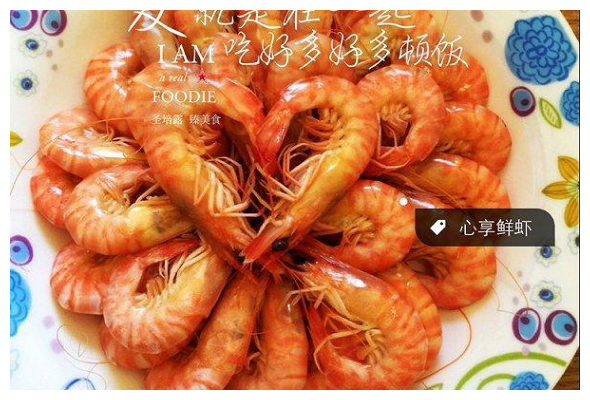

🖼️ Test Sample #4863 (4863.jpg)
🟢 Ground Truth : On a colourful plate, lots of white boiled shrimp in a bright-red colour.
🔵 Baseline     : The image shows a plate of shrimp in the shape of a heart with chinese characters written on it.
🟣 Finetuned    : A plate of prawns in the shape of a heart.
--------------------------------------------------------------------------------


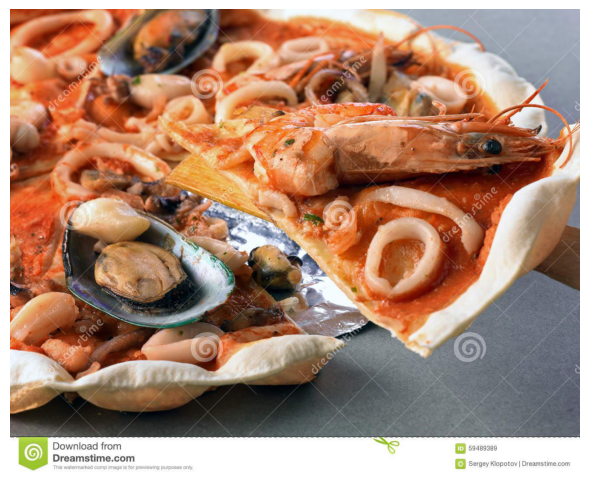

🖼️ Test Sample #4081 (4081.jpg)
🟢 Ground Truth : A portion of seafood pizza placed on a piece of tin foil, a small piece of which is on a wooden shovel.
🔵 Baseline     : The pizza in the image is a seafood pizza with clams and mussels on it.
🟣 Finetuned    : A seafood pizza with prawns, mussels and clams.
--------------------------------------------------------------------------------


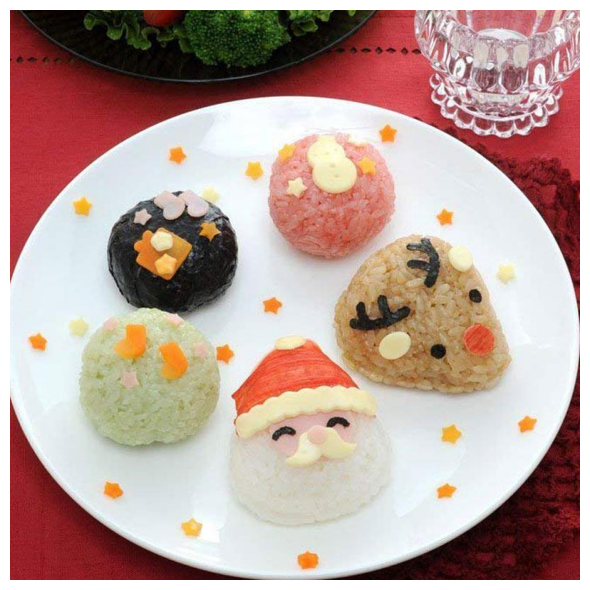

🖼️ Test Sample #3863 (3863.jpg)
🟢 Ground Truth : Five rice balls were used to make an interesting Christmas themed staple food, including white Santa Claus, light brown elk and pink, green and black round Christmas gifts, which were put together on a white round plate.
🔵 Baseline     : The image shows a white plate with a variety of shaped rice balls, including a santa claus, a reindeer, and a santa claus. There is also a glass of water on the table next to the plate.
🟣 Finetuned    : A plate of kawaii shaped rice balls with a santa claus, a reindeer, and a gingerbread man.
--------------------------------------------------------------------------------


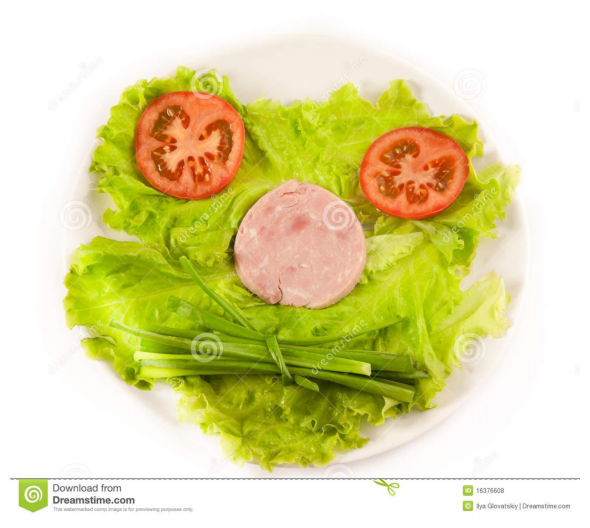

🖼️ Test Sample #2414 (2414.jpg)
🟢 Ground Truth : A serving of ham salad, contains a few pieces of lettuce with two sliced tomatoes, a sliced ham hunk and a small bunch of green bell shallots
🔵 Baseline     : The image shows a frog sandwich with lettuce, tomato, and onion on a white plate.
🟣 Finetuned    : A plate of frog made of lettuce, tomato and onion.
--------------------------------------------------------------------------------


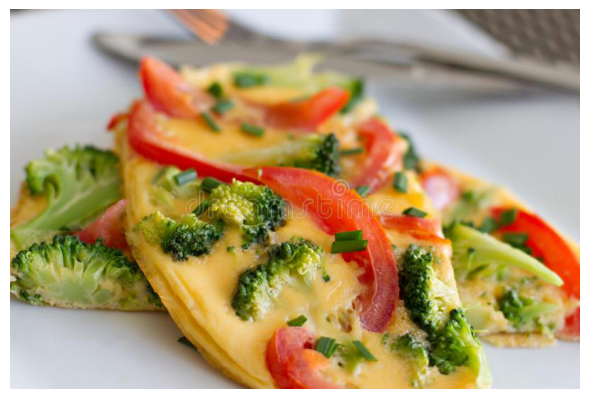

🖼️ Test Sample #4670 (4670.jpg)
🟢 Ground Truth : Two shares of tomato omelette with sliced tomato and broccoli cooking in it
🔵 Baseline     : The image shows an omelet with broccoli, tomatoes, and onions on a white plate. The omelet is topped with a fork and a knife.
🟣 Finetuned    : A plate of omelette with broccoli, tomatoes, and onions.
--------------------------------------------------------------------------------


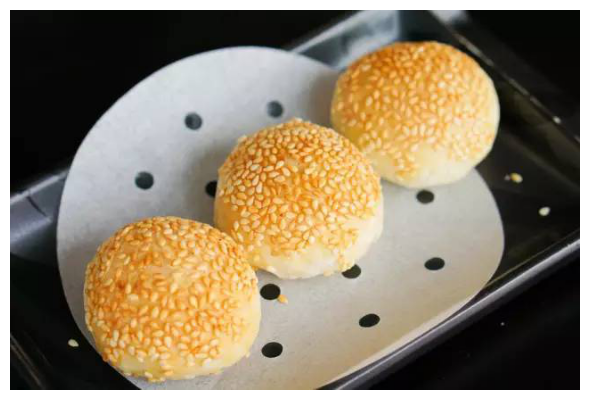

🖼️ Test Sample #2497 (2497.jpg)
🟢 Ground Truth : Three round beige-colored crispy Huangqiao sesame cakes on the sheet
🔵 Baseline     : The image shows three sesame buns on a black tray with a dot pattern. The buns are placed on a tray with a black background and suggesting that they are ready to be served..
🟣 Finetuned    : Three sesame buns with a lot of sesame seeds on the surface.
--------------------------------------------------------------------------------


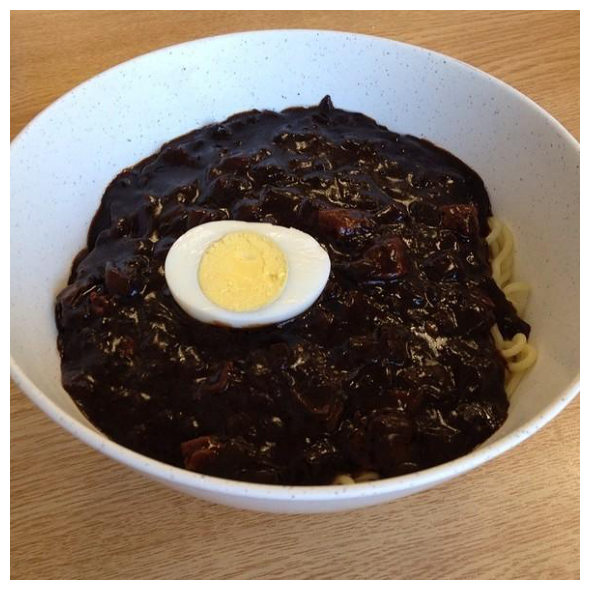

🖼️ Test Sample #2565 (2565.jpg)
🟢 Ground Truth : A white bowl of Jajangmyeon made with noodles covered with dark thick meat sauce and half-done boiled egg
🔵 Baseline     : The image shows a bowl of pasta with an egg on top. The bowl is sitting on a wooden table and which suggests that it is being served at a restaurant..
🟣 Finetuned    : A bowl of black bean soup with a hard-boiled egg on top.
--------------------------------------------------------------------------------


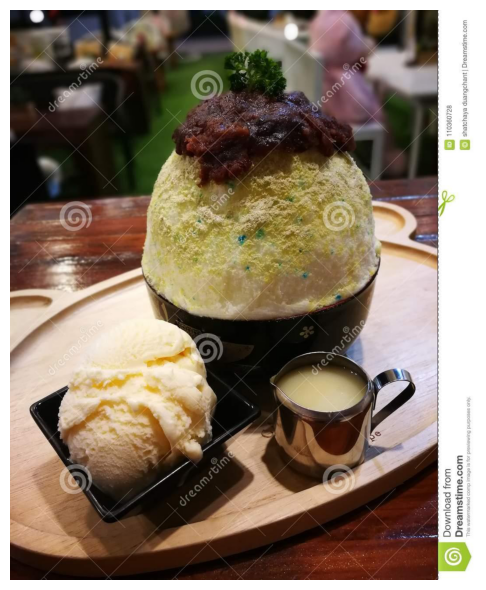

🖼️ Test Sample #3807 (3807.jpg)
🟢 Ground Truth : In the oval tray made of wood, there is a bowl of red bean ice with green powder and mashed red bean covered on the surface, with rolled leaf parsley on the top, a yellow ice cream ball on a small black square plate and a cup of milky condensed milk.
🔵 Baseline     : The image shows an ice cream dessert on a wooden tray with a scoop of ice cream and a bowl of shaved ice.
🟣 Finetuned    : A bowl of shaved ice with a scoop of ice cream and a saucer of shaved ice on a wooden tray.
--------------------------------------------------------------------------------


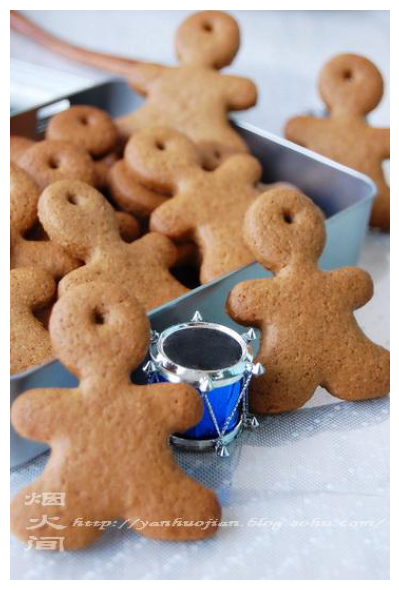

🖼️ Test Sample #2761 (2761.jpg)
🟢 Ground Truth : lebkuchens layered in and out of a baking tray in bread man shape
🔵 Baseline     : The image features a tray of gingerbread cookies in the shape of gingermen, along with a drum that is labeled with the word gingerbread.
🟣 Finetuned    : A tin of gingermen cookies with a drum on the side.
--------------------------------------------------------------------------------


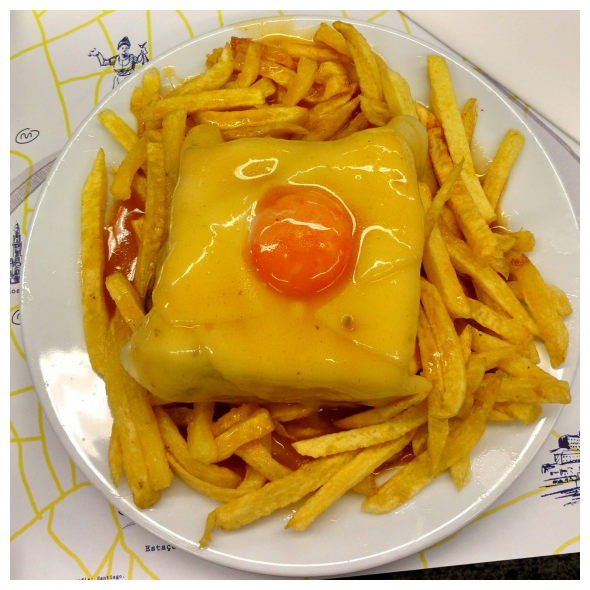

🖼️ Test Sample #2117 (2117.jpg)
🟢 Ground Truth : A francesinha with yellow sauce and a lot of french fries placed on tomato sauce on a white round plate.
🔵 Baseline     : The image depicts a plate of french fries with an egg on top, along with a piece of bread and a napkin.
🟣 Finetuned    : A plate of French fries topped with a poached egg.
--------------------------------------------------------------------------------


In [14]:
import json
import random
import matplotlib.pyplot as plt
from datasets import load_dataset
from PIL import Image
import os

# === CONFIG ===
NUM_SAMPLES = 10
TOP_K = 10
CAPTION_FILE_FINETUNED = "captions_finetuned_food500_test.json"
CAPTION_FILE_BASELINE = "/home/karina.abubakirova/NutriCaption/baseline/captions_baseline_food500_test.json"
CLIP_FILE = "clip_scores_food500cap_test.json"  # just for sorting
SHOW_CLIP = False  # we're not displaying it now

# === Load data ===
print("📦 Loading test set...")
dataset = load_dataset("advancedcv/Food500Cap_test")["test"]

print("📦 Loading generated captions...")
finetuned_captions = json.load(open(CAPTION_FILE_FINETUNED))
baseline_captions = json.load(open(CAPTION_FILE_BASELINE))

clip_scores = {}
if os.path.exists(CLIP_FILE):
    clip_scores = {
        k: v["clip_score"] for k, v in json.load(open(CLIP_FILE)).items()
    }

# === Select top K based on CLIP ===
top_filenames = sorted(clip_scores.items(), key=lambda x: x[1], reverse=True)[:TOP_K]
top_indices = [int(fname.replace(".jpg", "")) for fname, _ in top_filenames]

# === Visualization ===
for idx in top_indices:
    sample = dataset[idx]
    image = sample["image"]
    gt_caption = sample["caption"]
    fname = f"{idx}.jpg"

    gen_caption = finetuned_captions.get(fname, "❌ Not found")
    baseline_caption = baseline_captions.get(fname, "❌ Not found")

    gen_caption_clean = gen_caption.split(' (label:')[0]
    baseline_caption_clean = baseline_caption.split(' (label:')[0]

    # === Display Only Image ===
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    # === Print Captions to Terminal ===
    print(f"🖼️ Test Sample #{idx} ({fname})")
    print(f"🟢 Ground Truth : {gt_caption}")
    print(f"🔵 Baseline     : {baseline_caption_clean}")
    print(f"🟣 Finetuned    : {gen_caption_clean}")
    print("-" * 80)


## Experiment 4 Finetuned + Baseline + GT

📦 Loading test set...
📦 Loading generated captions...


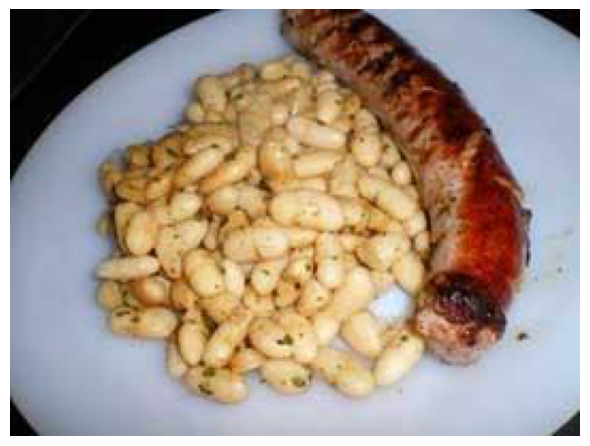

🖼️ Test Sample #712 (712.jpg)
🟢 Ground Truth : Charred botifarra and white lentils with some seaweed on a white plate
🔵 Baseline     : The image shows a sausage and beans on a white plate, with the word'sausage' written on the plate.
🟣 Finetuned    : On the white plate, there is a sausage and some white kidney beans with a sprinkle of parsley on top.
--------------------------------------------------------------------------------


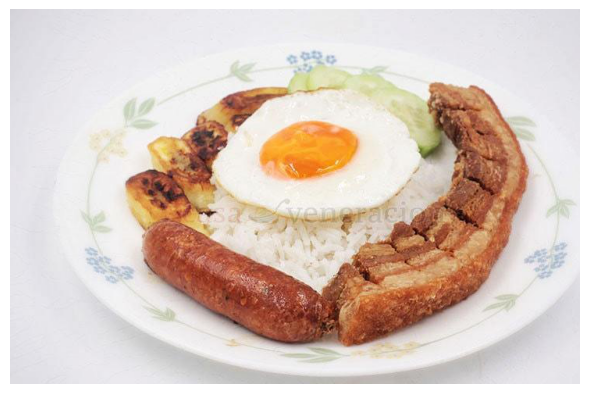

🖼️ Test Sample #441 (441.jpg)
🟢 Ground Truth : red sausage, cucumber slices, and a piece of fried streaky pork surrounding rice with a fried egg on the top.
🔵 Baseline     : The plate in the image contains a breakfast meal consisting of a fried egg, sausage, rice, and potatoes. The food is placed on a white table with a floral pattern, indicating that it is served in an asian restaurant.
🟣 Finetuned    : On the white plate with a floral pattern, there is a fried egg, a piece of sausage, a slice of cucumber, and a bowl of rice.
--------------------------------------------------------------------------------


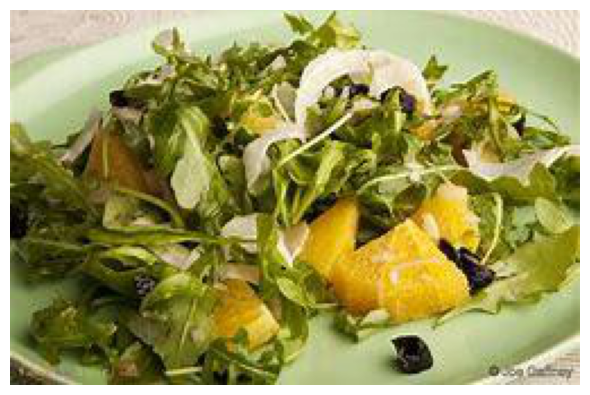

🖼️ Test Sample #4168 (4168.jpg)
🟢 Ground Truth : A plate of sicilian orange salad with chicory, onion slices, orange slices and black olives.
🔵 Baseline     : The orange arugula salad is on a green plate with parmesan cheese and black olives.
🟣 Finetuned    : A green plate with arugula, oranges, and black olives on it. The salad is made of arugula, oranges, and black olives.
--------------------------------------------------------------------------------


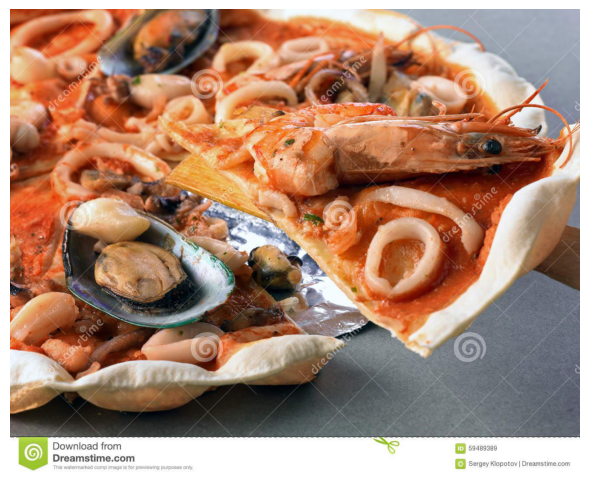

🖼️ Test Sample #4081 (4081.jpg)
🟢 Ground Truth : A portion of seafood pizza placed on a piece of tin foil, a small piece of which is on a wooden shovel.
🔵 Baseline     : The pizza in the image is a seafood pizza with clams and mussels on it.
🟣 Finetuned    : A seafood pizza with prawns, clams, mussels, and shrimps on the surface, served with a fork on the side.
--------------------------------------------------------------------------------


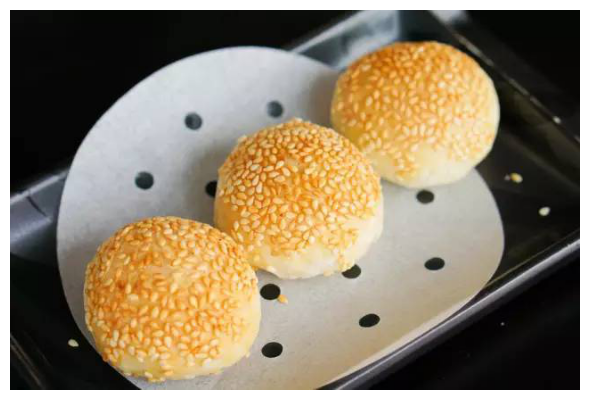

🖼️ Test Sample #2497 (2497.jpg)
🟢 Ground Truth : Three round beige-colored crispy Huangqiao sesame cakes on the sheet
🔵 Baseline     : The image shows three sesame buns on a black tray with a dot pattern. The buns are placed on a tray with a black background and suggesting that they are ready to be served..
🟣 Finetuned    : There are three fried cheese buns on a black tray with a sprinkled surface, and one of them is topped with a layer of white sesame seeds. The fried cheese buns are covered with a layer of white sesame seeds and placed on a black tray with a pattern of dots.
--------------------------------------------------------------------------------


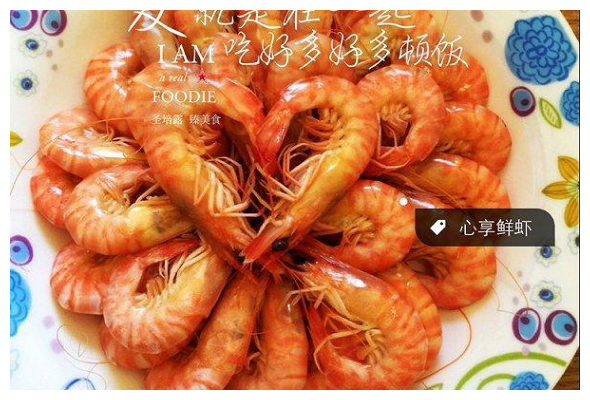

🖼️ Test Sample #4863 (4863.jpg)
🟢 Ground Truth : On a colourful plate, lots of white boiled shrimp in a bright-red colour.
🔵 Baseline     : The image shows a plate of shrimp in the shape of a heart with chinese characters written on it.
🟣 Finetuned    : A plate of prawns in the shape of a heart is placed on a flower-patterned plate with a floral pattern. The prawns are arranged in a heart-shaped pattern, and there are some prawns scattered on the plate.
--------------------------------------------------------------------------------


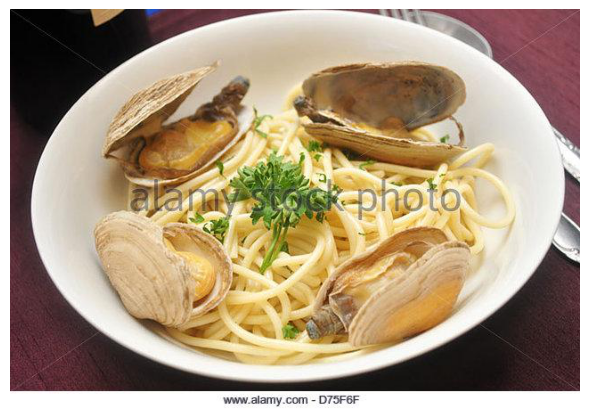

🖼️ Test Sample #4309 (4309.jpg)
🟢 Ground Truth : A white soup bowl holds a serving of boiled noodles with steamed clams and is served with a green leaf garnish dish.
🔵 Baseline     : The image shows a bowl of pasta with clams and a bottle of wine next to it.
🟣 Finetuned    : A plate of steamed clams served with pasta, garnished with parsley and served with a bottle of wine on the side.
--------------------------------------------------------------------------------


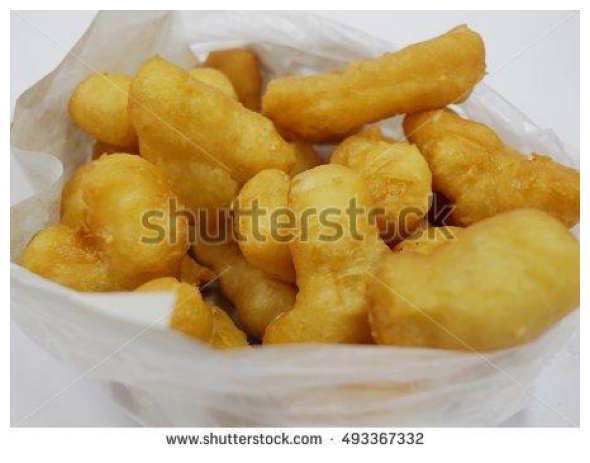

🖼️ Test Sample #4915 (4915.jpg)
🟢 Ground Truth : Some short Youtiaos with a crispy texture and golden colour are in a plastic bag.
🔵 Baseline     : Fried fish in a plastic bag on a white background.
🟣 Finetuned    : The white paper bag contains a lot of deep-fried fish balls with a crispy and golden surface. There is a lot of fish balls in the bag, and some of them are slightly charred on the surface.
--------------------------------------------------------------------------------


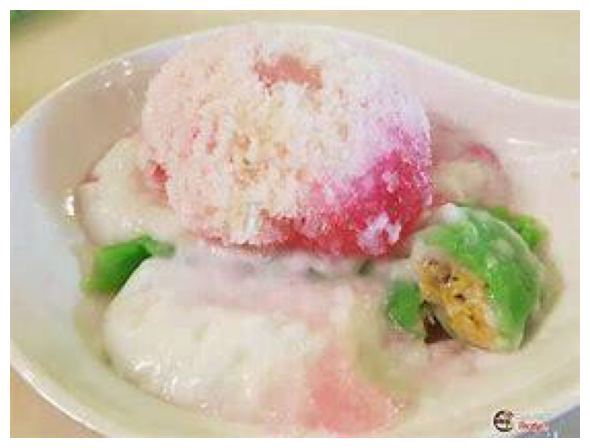

🖼️ Test Sample #2012 (2012.jpg)
🟢 Ground Truth : A plate of Es pisang ijo including powdered ice, pink sugar syrup, condensed milk and banana with green pancake surface
🔵 Baseline     : There is a bowl of ice cream in the image with the word shaved ice on it.
🟣 Finetuned    : There is a white bowl of ice cream with pink and white ice cubes on top. The ice cubes are covered with a layer of white ice cream, and there is a plate of ice cream next to it. The ice cubes are covered with a layer of white ice cream, and there.
--------------------------------------------------------------------------------


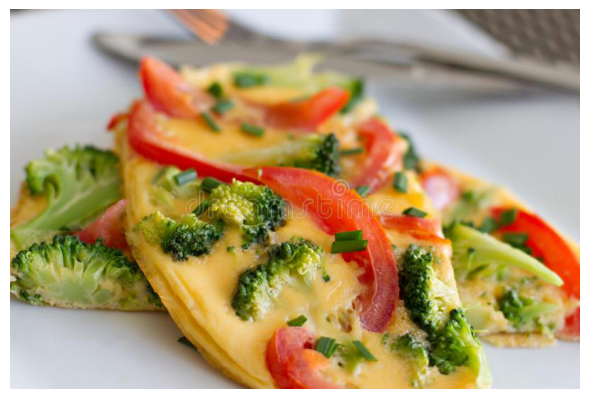

🖼️ Test Sample #4670 (4670.jpg)
🟢 Ground Truth : Two shares of tomato omelette with sliced tomato and broccoli cooking in it
🔵 Baseline     : The image shows an omelet with broccoli, tomatoes, and onions on a white plate. The omelet is topped with a fork and a knife.
🟣 Finetuned    : On the white plate, there is a Denver omelette with broccoli, tomatoes, and onions. The Denver omelette is topped with cheese and served with a fork on the side.
--------------------------------------------------------------------------------


In [ ]:
import json
import matplotlib.pyplot as plt
from datasets import load_dataset
import os

# === CONFIG ===
TOP_K = 10
CAPTION_FILE_FINETUNED = "/home/karina.abubakirova/NutriCaption/captions_finetuned_final_food500_test.json"
CAPTION_FILE_BASELINE = "/home/karina.abubakirova/NutriCaption/baseline/captions_baseline_food500_test.json"
CLIP_FILE = "/home/karina.abubakirova/NutriCaption/clip_scores_finetuned_final_food500_test.json"

# === Load data ===
print("📦 Loading test set...")
dataset = load_dataset("advancedcv/Food500Cap_test")["test"]

print("📦 Loading generated captions...")
finetuned_captions = json.load(open(CAPTION_FILE_FINETUNED))
baseline_captions = json.load(open(CAPTION_FILE_BASELINE))

clip_scores = {}
if os.path.exists(CLIP_FILE):
    clip_scores = {
        k: v["clip_score"] for k, v in json.load(open(CLIP_FILE)).items()
    }

# === Select top K based on CLIP ===
top_filenames = sorted(clip_scores.items(), key=lambda x: x[1], reverse=True)[:TOP_K]
top_indices = [int(fname.replace(".jpg", "")) for fname, _ in top_filenames]

# === Visualization ===
for idx in top_indices:
    sample = dataset[idx]
    image = sample["image"]
    gt_caption = sample["caption"]
    fname = f"{idx}.jpg"

    gen_caption = finetuned_captions.get(fname, "❌ Not found")
    baseline_caption = baseline_captions.get(fname, "❌ Not found")

    gen_caption_clean = gen_caption.split(' (label:')[0]
    baseline_caption_clean = baseline_caption.split(' (label:')[0]

    # === Display Only Image ===
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    # === Print Captions to Terminal ===
    print(f"🖼️ Test Sample #{idx} ({fname})")
    print(f"🟢 Ground Truth : {gt_caption}")
    print(f"🔵 Baseline     : {baseline_caption_clean}")
    print(f"🟣 Finetuned    : {gen_caption_clean}")
    print("-" * 80)
